<a href="https://colab.research.google.com/github/Cferro2793/cbam/blob/main/RESNET_LAB_1__cbam_nature.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
import numpy as np
import tensorflow.keras as keras
from keras.models import Sequential
from keras.models import Model #faltaba
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense,   Activation, BatchNormalization, Add, Multiply, Input, Reshape, Conv2DTranspose
from keras.layers import AveragePooling2D, GlobalAveragePooling2D,AveragePooling1D, GlobalAveragePooling1D, Lambda, Concatenate
from matplotlib import pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from keras import regularizers, optimizers
from keras.datasets import cifar10
from tensorflow.keras.regularizers import l2
import tensorflow as tf


In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
import datetime, os
#import keras.models 
from keras.models import Sequential
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense, Activation, BatchNormalization, Add, Multiply, Input, Reshape
from keras.layers import AveragePooling2D, GlobalAveragePooling2D
from matplotlib import pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from keras import regularizers, optimizers
from keras.datasets import cifar10
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
import datetime
import cv2
from keras.preprocessing.image import img_to_array
from IPython.display import Image, display
import matplotlib.cm as cm
from keras.utils import np_utils

# **DATASET**

In [5]:
from keras.preprocessing.image import array_to_img

In [6]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/Colab Notebooks/natural/data/natural_images'):
    for filename in filenames:
        (os.path.join(dirname, filename))

In [45]:
labels = os.listdir('/content/drive/MyDrive/Colab Notebooks/natural/data/natural_images')
print(labels)
etiquetas_2 = np.array([0,1,2,3,4,5,6,7,8])

['person', 'motorbike', 'airplane', 'car', 'dog', 'cat', 'fruit', 'flower']


In [8]:
x_data =[]
y_data = []
import cv2
for label in labels:
    path = '/content/drive/MyDrive/Colab Notebooks/natural/data/natural_images/{0}/'.format(label)
    folder_data = os.listdir(path)
    for image_path in folder_data:
        image = cv2.imread(path+image_path)
        image_resized = cv2.resize(image, (64,64))
        x_data.append(np.array(image_resized))
        y_data.append(label)

In [9]:
x_data = np.array(x_data)
y_data = np.array(y_data)
print('the shape of X is: ', x_data.shape, 'and that of Y is: ', y_data.shape)

the shape of X is:  (6899, 64, 64, 3) and that of Y is:  (6899,)


In [10]:
x_data = x_data.astype('float32')/255


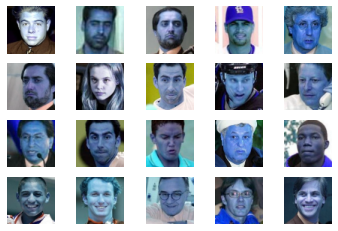

In [11]:
for i in range(0,20):
  plt.subplot(4,5,i+1)
  plt.axis('off')
  plt.imshow(array_to_img(x_data[i]))
plt.show()

In [12]:
#one hot encoding
from sklearn.preprocessing import LabelEncoder
y_encoded = LabelEncoder().fit_transform(y_data)
from tensorflow.keras.utils import to_categorical
y_categorical = to_categorical(y_encoded)

In [13]:
#lets shuffle all the data we have:
r = np.arange(x_data.shape[0])
np.random.seed(42)
np.random.shuffle(r)
X = x_data[r]
Y = y_categorical[r]

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.33)

In [ ]:
'''from keras.preprocessing.image import array_to_img
from keras.utils import np_utils


#extration of dataset
(x_train,y_train),(x_test,y_test)= cifar10.load_data()

#plot of dataset
#for i in range(0,15):
#  plt.subplot(3,5,i+1)
#  plt.axis('off')
#  plt.imshow(array_to_img(x_test[i]))
#plt.show()

#normalization
x_train=x_train.astype('float32')/255.0
x_test =x_test.astype('float32')/255.0
#x_train_mean = np.mean(x_train, axis=0)
#x_train -= x_train_mean
#x_test_mean = np.mean(x_test, axis=0)
#x_test -= x_test_mean

#print(y_train.shape, y_test.shape)

from keras.utils import np_utils


#one hot encoding
num_classes = 10
y_train = np_utils.to_categorical(y_train,num_classes)
y_test = np_utils.to_categorical(y_test,num_classes)


#%cd "/content/drive/MyDrive/ESPECIALZIACION/2Semestre/DEEP LEARNING AVANZADO-paniagua/squeez_grad_cbam/"
#!ls
etiquetas = np.array(['aeroplano','automovil','pajaro','gato','ciervo','perro','rana','caballo','barco','camion'])
etiquetas_2 = np.array([0,1,2,3,4,5,6,7,8,9])'''

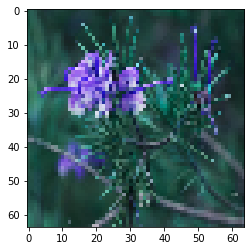

In [15]:
X_test[20][:][:][:]
im = plt.imshow(X_test[20][:][:][:])
plt.show()

# **FUNTIONS FOR GRAD - CAM**

In [31]:
#Algortimo de GradCAM para visualizacion
#Author: fchollet
#Libro: Deep Learning with Python (2017)
#Description: How to obtain a class activation heatmap for an image classification model.

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    if size == False:
      img = keras.preprocessing.image.load_img(img_path)
    else:
      img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [32]:
def save_and_display_gradcam(img_path, heatmap, cam_path, alpha=0.4):
    # Load the original image
    img =keras.preprocessing.image.array_to_img(img_path)
    #img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)
    #img = img_path[0][:][:][:]

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM

    #display(Image(cam_path))
    return cam_path

# **FUNCTIONS FOR ATENTION MODELS**

CBAM

In [33]:
#CHANEL ATENTION
def ch_attention(input_t, ratio=8):
  inputs = input_t
  channel_axis=1 if K.image_data_format()=='channels_first' else -1
  filters = inputs.shape[channel_axis]

  #definir la MLP compartida
  MLP_Layer_S1 = Dense(filters//ratio, activation='relu', kernel_initializer='he_normal', use_bias = True, bias_initializer='zeros')
  MLP_Layer_S2 = Dense(filters, activation='relu', kernel_initializer='he_normal', use_bias = True, bias_initializer='zeros')

  #operando el average pooling
  avg_pool = GlobalAveragePooling2D()(inputs)
  avg_pool = Reshape((1,1,filters))(avg_pool)
  avg_pool = MLP_Layer_S1(avg_pool)
  avg_pool = MLP_Layer_S2(avg_pool)

  #operando el max pooling
  max_pool = MaxPooling2D(pool_size=(inputs.shape[-3],inputs.shape[-2]),strides=(1, 1))(inputs)
  max_pool = Reshape((1,1,filters))(max_pool)
  max_pool = MLP_Layer_S1(max_pool)
  max_pool = MLP_Layer_S2(max_pool)

  #sumando las dos operacione

  cbam_feat_ch = Add()([avg_pool, max_pool])

  cbam_feat_ch = Activation('sigmoid')(cbam_feat_ch)

  cbam_feat_ch = Multiply()([cbam_feat_ch, inputs])
  return cbam_feat_ch


In [34]:
#SPACIAL ATENTION
def sp_attention(input_t, kz =7):
  inputs = input_t
  avg_pool = Lambda(lambda x: K.max(x,axis=3, keepdims=True))(inputs)
  max_pool = Lambda(lambda x: K.mean(x,axis=3, keepdims=True))(inputs)
  concat = Concatenate(axis =3)([avg_pool, max_pool])
  cbam_feat_sp = Conv2D(filters=1, kernel_size=kz,strides=1, padding='same', activation='sigmoid',
  kernel_initializer='he_normal', use_bias = False)(concat)
  cbam_feat_sp = Multiply()([cbam_feat_sp,inputs])
  return(cbam_feat_sp)


In [35]:
#UNION OF FUNTION
def cbam_block(input_t):
  inputs=input_t
  cbam_feat_ch = ch_attention(inputs)
  cbam_feat = sp_attention(cbam_feat_ch)
  
  return cbam_feat


Squeeze - Excitation

In [36]:
def squeeze_excite_block(input_t, ratio=16):
  init = input_t
  channel_axis=1 if K.image_data_format()=="channel_first" else -1
  filters = init.shape[channel_axis]
  se_shape=(1,1,filters)
  se = GlobalAveragePooling2D()(init)
  se = Reshape(se_shape)(se)
  se = Dense(filters // ratio, activation='relu', 
             kernel_initializer='he_normal', use_bias=False)(se)
  se = Dense(filters, activation='sigmoid',
             kernel_initializer='he_normal',use_bias=False)(se)
  x = Multiply()([init, se])     
  return x      


# **FUNTION TO CREATE RESNET**

In [21]:
def initial_block_conv(Input, filters,kz=7,stride=1):
  x = Conv2D(filters,kernel_size=(kz,kz),strides=(stride,stride), padding='same', use_bias =False)(Input)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

In [22]:
def conv_block(Input,filters,stride=1):
  #Bloque 1x1
  x = Conv2D(filters,kernel_size=(1,1),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(Input)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #Bloque 3x3
  x = Conv2D(filters,kernel_size=(3,3),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #Bloque 1x1
  x = Conv2D(filters*4,kernel_size=(1,1),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(x)
  x = BatchNormalization()(x)
  #x = Activation(x)

  #Shortcut
  skip_conv = Conv2D(filters*4,kernel_size=(1,1),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(Input)
  skip_conv= BatchNormalization()(skip_conv)
  
  #sumar 
  x = Add()([x,skip_conv])
  return x


In [23]:
def ident_block(Input,filters,sqex,cbam,stride=1):
  #Bloque 1x1
  x = Conv2D(filters,kernel_size=(1,1),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(Input)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #Bloque 3x3
  x = Conv2D(filters,kernel_size=(3,3),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #Bloque 1x1
  x = Conv2D(filters*4,kernel_size=(1,1),strides=(stride,stride), padding='same', kernel_initializer='he_normal', use_bias =False)(x) #ojo con la dimenrsion
  x = BatchNormalization()(x)
  #x = Activation(x)
  if sqex == True:
    x= squeeze_excite_block(x,16)
  if cbam == True:
    x= cbam_block(x)
  
    
  #sumar 
  x = Add()([x,Input])
  return x

In [24]:
def ResNet50(h,w,n_outputs,r1,r2,r3,r4,sqex,cbam,first_kernel_size=3, first_stride=1):
  inputs = Input(shape=(h,w,3))

  #pre-stem (usted puede descomentar esta parte si desea usar pre-stem con el fin de aumentar el tamaño de la imagen de entrada )
  # deconvolucion1, toma la imagen de CIFAR (32, 32, 3) and se obtiene una imagen de  (64, 64, 3)
  #x = Conv2DTranspose(3, (3, 3), strides=2, padding='same', activation='relu')(inputs)
  #x = (BatchNormalization())(x)
  #deconvolucion2, se obtiene una imagen de  (128, 128, 3) la cual será la entrada a la ResNet50
  x = Conv2DTranspose(3, (3, 3), strides=2, padding='same', activation='relu')(inputs)
  x = (BatchNormalization())(x)

  #Stage 1
  x = initial_block_conv(x,64,first_kernel_size, first_stride)
  
  #x = initial_block_conv(inputs,64,first_kernel_size, first_stride)
  x = MaxPooling2D(pool_size=(3,3),strides=(2,2))(x)
  
  #Stage 2
  x = conv_block(x,64,1)
  x = Activation('relu')(x)
  for i in range(r1-1):
    
    x = ident_block(x,64,sqex,cbam,1)
    x = Activation('relu')(x)

  #Stage 3
  x = conv_block(x,128,1)
  x = Activation('relu')(x)
  for i in range(r2-1):
    x = ident_block(x,128,sqex,cbam,1)
    x = Activation('relu')(x)
  
  #Stage 4
  x = conv_block(x,256,1)
  x = Activation('relu')(x)
  for i in range(r3-1):
    x = ident_block(x,256,sqex,cbam,1)
    x = Activation('relu')(x)

  #Stage 5
  x = conv_block(x,512,1)
  x = Activation('relu')(x)
  for i in range(r4-1):
    x = ident_block(x,512,sqex,cbam,1)
    x = Activation('relu')(x)

  x_shape = K.int_shape(x)
  print(x_shape)
  x = AveragePooling2D(pool_size=(x_shape[1],x_shape[2]),strides=(1,1))(x) #Ojo con el shape
  x = Flatten()(x)
  x = Dense(1000,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(1e-4))(x)
  x = Dense(n_outputs,activation='softmax')(x)
  modelo = Model(inputs=inputs, outputs=x)
  return modelo

  

# **CREATE MODEL**

In [25]:
mod_RN =ResNet50(64,64,8,3,4,6,3,False,True,7,1)
mod_RN.summary()

(None, 63, 63, 2048)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 128, 128, 3)  84         ['input_1[0][0]']                
 ose)                                                                                             
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 3)  12         ['conv2d_transpose[0][0]']       
 alization)                                                                                       
                                                                         

In [26]:
from keras.utils.vis_utils import plot_model

In [27]:
plot_model(mod_RN,"ResNet50.png", show_shapes=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.978265 to fit



# **TRAIN OF MODEL**

In [ ]:
#Realizar un Schedule para el learning rate y un checkpoint para salvar los pesos
#Existen diferente maneras de reducir el LR esta es una de ellas
# LR = initial_LR *drop **((1+epoch)/epochs_drop)
import math
def paso_deca(epoch):
  initial_LR = 0.1
  drop = 0.7
  epochs_drop = 7
  LRate = initial_LR * math.pow(drop, math.floor((1+epoch)/epochs_drop))
  return LRate


In [ ]:
from keras.callbacks import LearningRateScheduler, EarlyStopping
LRate = LearningRateScheduler(paso_deca)

In [59]:
# checkpoint
from keras.callbacks import ModelCheckpoint
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
filepath="/content/drive/MyDrive/Colab/RESNET_CBAM.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [60]:
early_stopping=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=5,restore_best_weights=True)
#early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=0, mode='auto', baseline=None, restore_best_weights=True)
optimiz = keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, amsgrad=False)
mod_RN.compile(loss='categorical_crossentropy', optimizer=optimiz, metrics=['accuracy'])

In [65]:
batch_size=8 #64
epochs=30
#TRAIN FOR ONCE
history = mod_RN.fit(X_train,Y_train, batch_size=batch_size*1,epochs=epochs,validation_data=(X_test,Y_test), shuffle=True, verbose=1, callbacks=[checkpoint, early_stopping,tensorboard_callback])
%tensorboard --logdir logs


Epoch 1/30
578/578 [==============================] - ETA: 0s - loss: 1.4728 - accuracy: 0.5474
Epoch 1: val_accuracy improved from -inf to 0.58147, saving model to /content/drive/MyDrive/Colab/RESNET_CBAM.hdf5
578/578 [==============================] - 666s 1s/step - loss: 1.4728 - accuracy: 0.5474 - val_loss: 1.4444 - val_accuracy: 0.5815
Epoch 2/30
578/578 [==============================] - ETA: 0s - loss: 0.9418 - accuracy: 0.6897
Epoch 2: val_accuracy improved from 0.58147 to 0.65217, saving model to /content/drive/MyDrive/Colab/RESNET_CBAM.hdf5
578/578 [==============================] - 675s 1s/step - loss: 0.9418 - accuracy: 0.6897 - val_loss: 1.0479 - val_accuracy: 0.6522
Epoch 3/30
578/578 [==============================] - ETA: 0s - loss: 0.6967 - accuracy: 0.7694
Epoch 3: val_accuracy improved from 0.65217 to 0.82301, saving model to /content/drive/MyDrive/Colab/RESNET_CBAM.hdf5
578/578 [==============================] - 674s 1s/step - loss: 0.6967 - accuracy: 0.7694 - val_l

<IPython.core.display.Javascript object>

In [28]:
mod_RN.load_weights("/content/drive/MyDrive/Colab/RESNET_CBAM.hdf5")


In [ ]:
batch_size=64 #64
epochs=30
#TRAIN FOR TWICE
history = mod_RN.fit(x_train,y_train, batch_size=batch_size*1,epochs=epochs,validation_data=(x_test,y_test), shuffle=True, verbose=1, callbacks=[checkpoint, early_stopping], initial_epoch=14)
%tensorboard --logdir logs

# **GRAD-CAM**

In [ ]:
%cd /content/drive/MyDrive/ESPECIALZIACION/2Semestre/DEEP LEARNING AVANZADO-paniagua/LABORATORIO 1/VALIDATION

/content/drive/.shortcut-targets-by-id/1P8Xt1vYiTKykopL3Em6CkQ6McTKjvoAC/ESPECIALZIACION/2Semestre/DEEP LEARNING AVANZADO-paniagua/LABORATORIO 1/VALIDATION


/content/drive/MyDrive/Colab/validacion
////////////////////////////////////////////////////////////
IMAGEN REAL



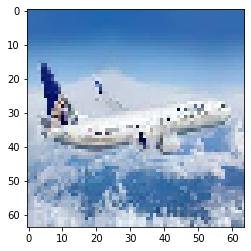

la imagen real es un: avion1.

ANALISIS DE LA PREDICCIÓN

heatmap


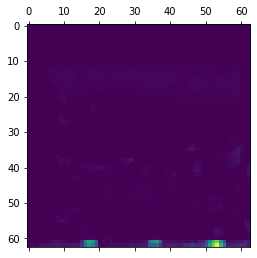

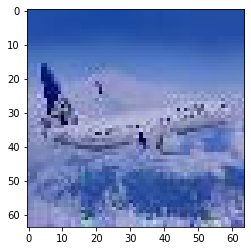


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



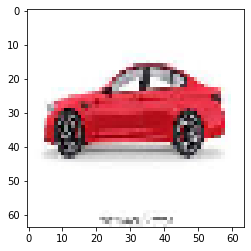

la imagen real es un: carro1.

ANALISIS DE LA PREDICCIÓN

heatmap


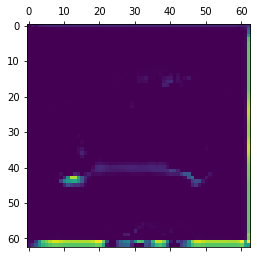

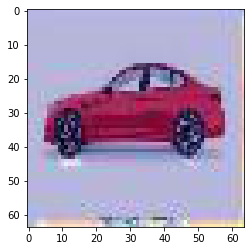


la predicción de la red es: cat


////////////////////////////////////////////////////////////
IMAGEN REAL



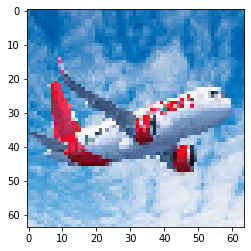

la imagen real es un: avion2.

ANALISIS DE LA PREDICCIÓN

heatmap


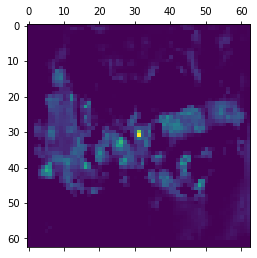

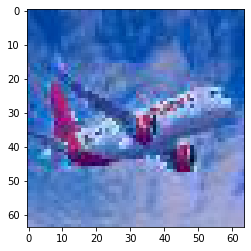


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



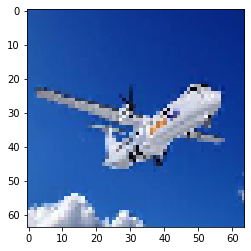

la imagen real es un: avion3.

ANALISIS DE LA PREDICCIÓN

heatmap


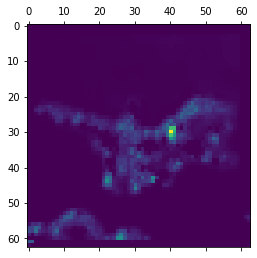

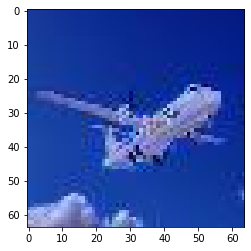


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



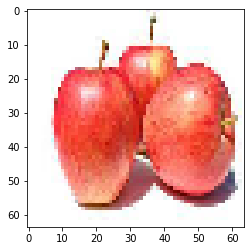

la imagen real es un: fruta1.

ANALISIS DE LA PREDICCIÓN

heatmap


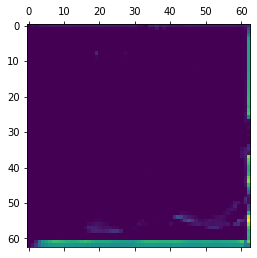

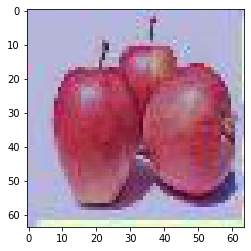


la predicción de la red es: cat


////////////////////////////////////////////////////////////
IMAGEN REAL



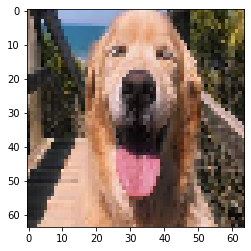

la imagen real es un: perro3.

ANALISIS DE LA PREDICCIÓN

heatmap


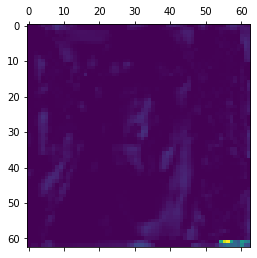

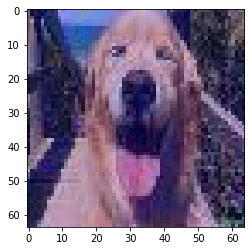


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



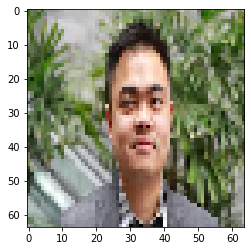

la imagen real es un: person2.

ANALISIS DE LA PREDICCIÓN

heatmap


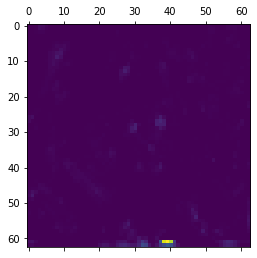

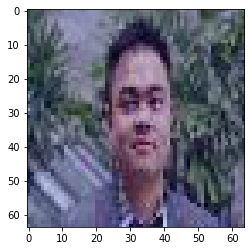


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



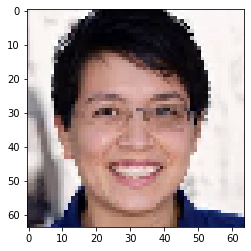

la imagen real es un: person3.

ANALISIS DE LA PREDICCIÓN

heatmap


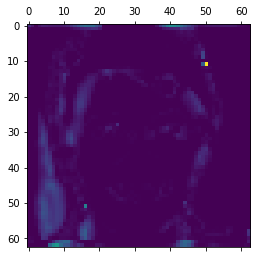

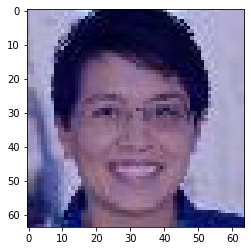


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



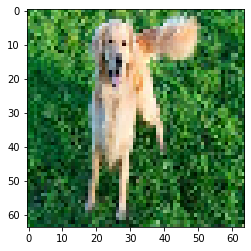

la imagen real es un: perro1.

ANALISIS DE LA PREDICCIÓN

heatmap


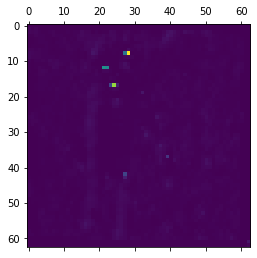

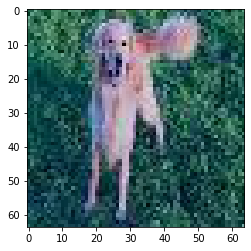


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



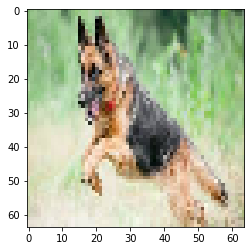

la imagen real es un: perro2.

ANALISIS DE LA PREDICCIÓN

heatmap


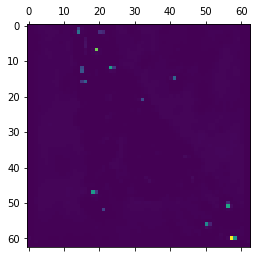

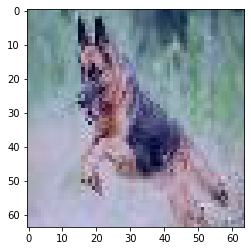


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



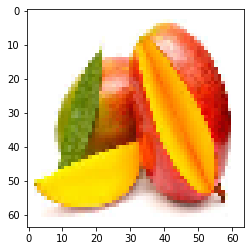

la imagen real es un: fruta2.

ANALISIS DE LA PREDICCIÓN

heatmap


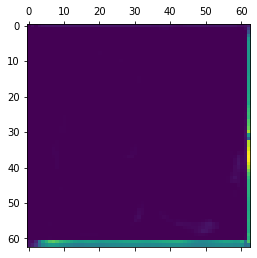

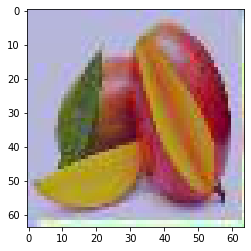


la predicción de la red es: cat


////////////////////////////////////////////////////////////
IMAGEN REAL



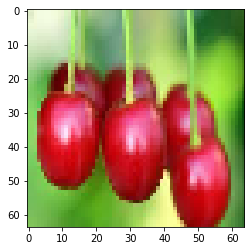

la imagen real es un: fruta3.

ANALISIS DE LA PREDICCIÓN

heatmap


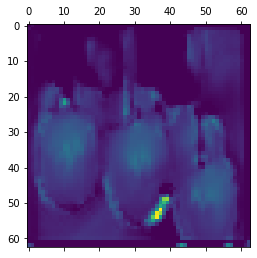

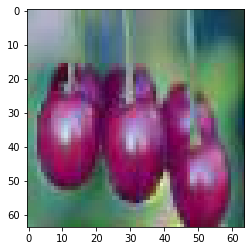


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



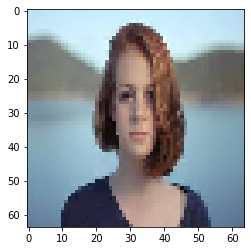

la imagen real es un: person1.

ANALISIS DE LA PREDICCIÓN

heatmap


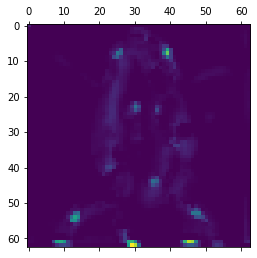

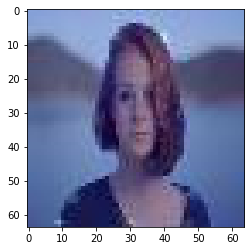


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



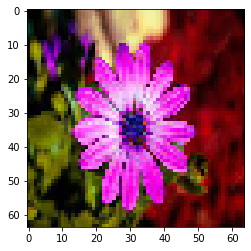

la imagen real es un: flor1.

ANALISIS DE LA PREDICCIÓN

heatmap


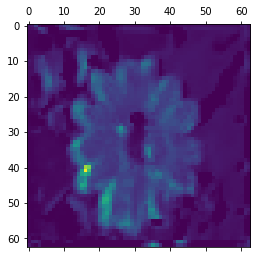

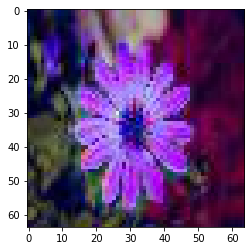


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



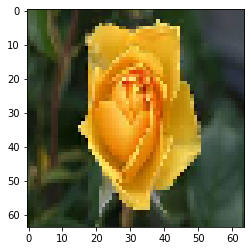

la imagen real es un: flor3.

ANALISIS DE LA PREDICCIÓN

heatmap


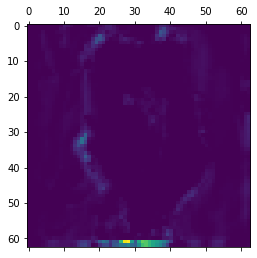

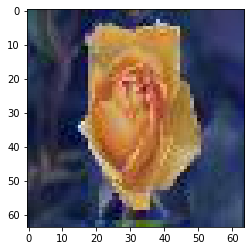


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



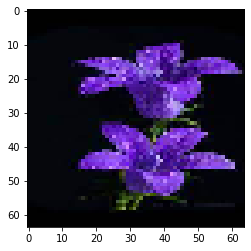

la imagen real es un: flor2.

ANALISIS DE LA PREDICCIÓN

heatmap


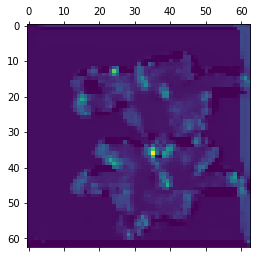

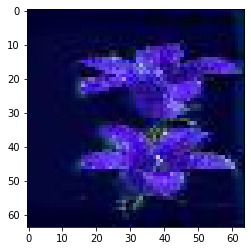


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



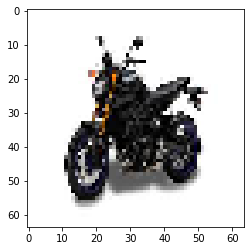

la imagen real es un: moto2.

ANALISIS DE LA PREDICCIÓN

heatmap


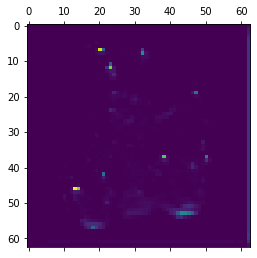

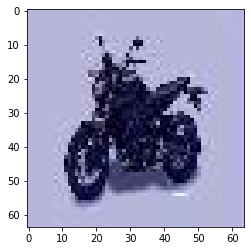


la predicción de la red es: fruit


////////////////////////////////////////////////////////////
IMAGEN REAL



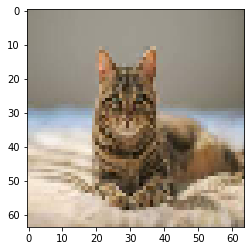

la imagen real es un: gato1.

ANALISIS DE LA PREDICCIÓN

heatmap


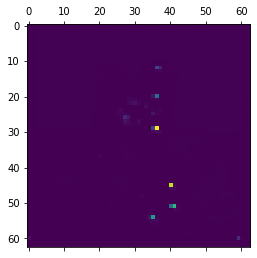

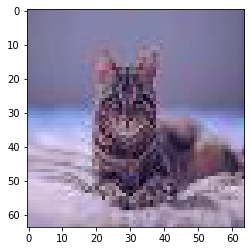


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



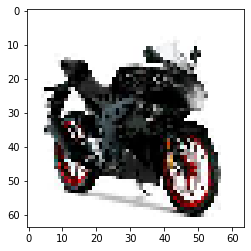

la imagen real es un: moto3.

ANALISIS DE LA PREDICCIÓN

heatmap


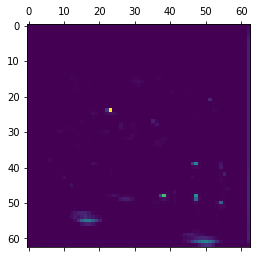

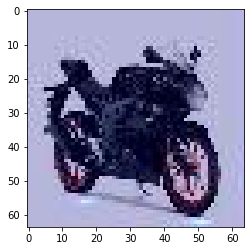


la predicción de la red es: fruit


////////////////////////////////////////////////////////////
IMAGEN REAL



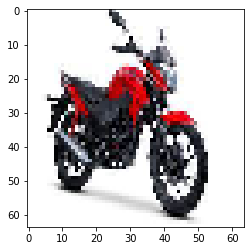

la imagen real es un: moto1.

ANALISIS DE LA PREDICCIÓN

heatmap


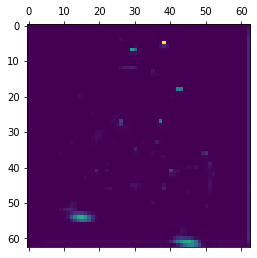

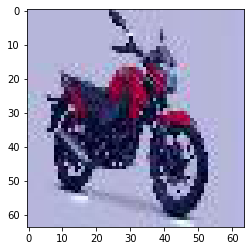


la predicción de la red es: fruit


////////////////////////////////////////////////////////////
IMAGEN REAL



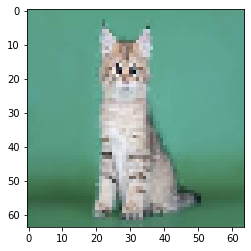

la imagen real es un: gato3.

ANALISIS DE LA PREDICCIÓN

heatmap


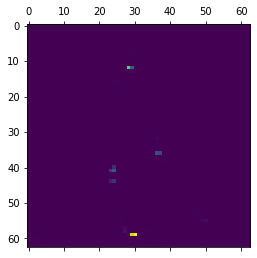

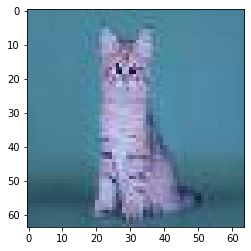


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



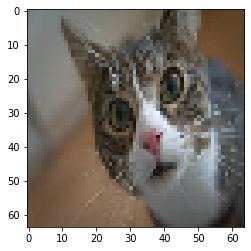

la imagen real es un: gato2.

ANALISIS DE LA PREDICCIÓN

heatmap


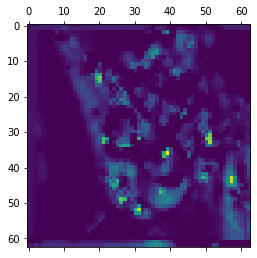

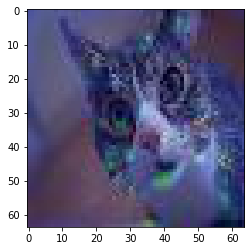


la predicción de la red es: airplane


////////////////////////////////////////////////////////////
IMAGEN REAL



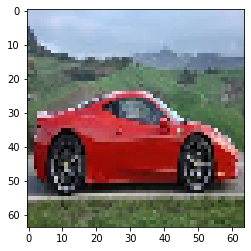

la imagen real es un: carro3.

ANALISIS DE LA PREDICCIÓN

heatmap


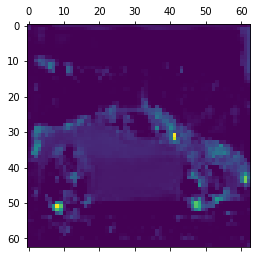

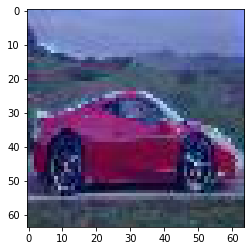


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



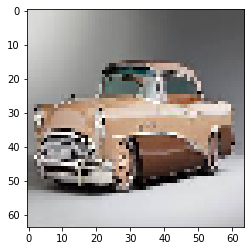

la imagen real es un: carro2.

ANALISIS DE LA PREDICCIÓN

heatmap


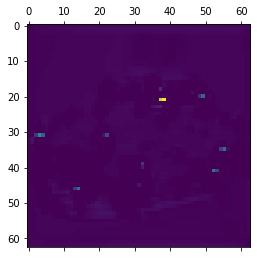

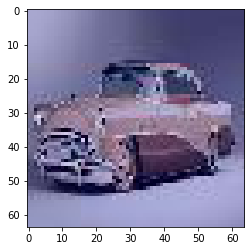


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



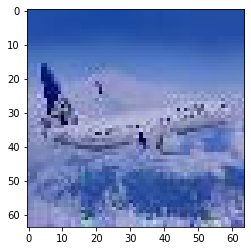

la imagen real es un: avion1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


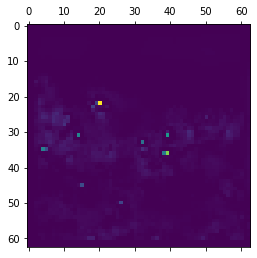

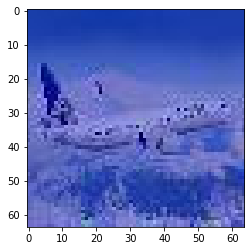


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



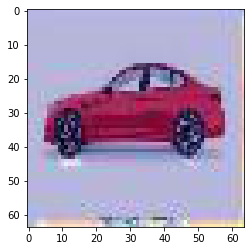

la imagen real es un: carro1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


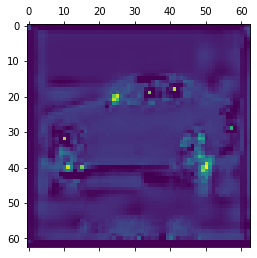

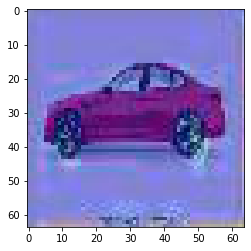


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



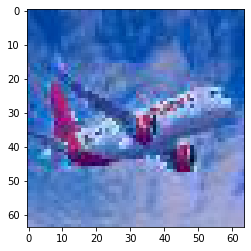

la imagen real es un: avion2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


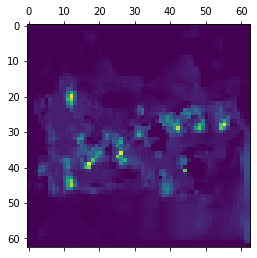

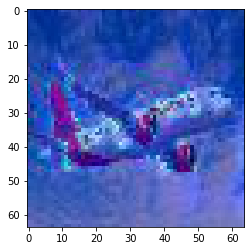


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



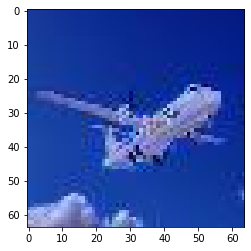

la imagen real es un: avion3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


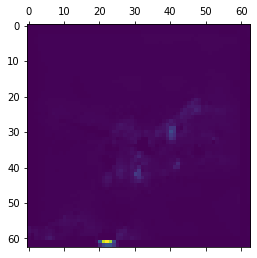

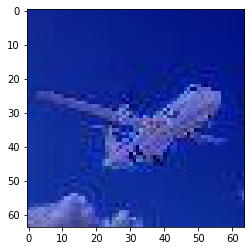


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



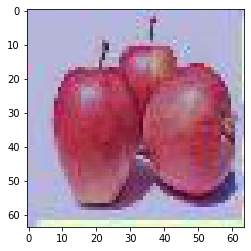

la imagen real es un: fruta1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


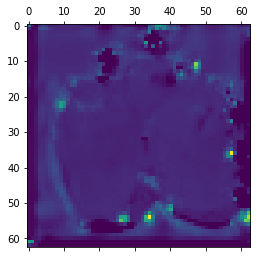

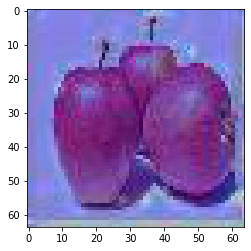


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



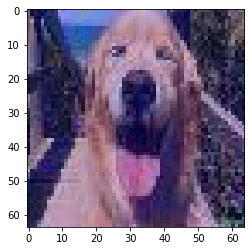

la imagen real es un: perro3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


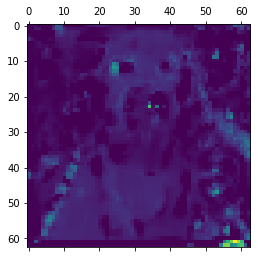

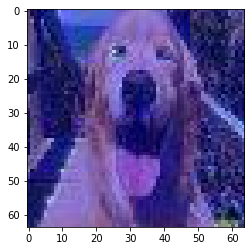


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



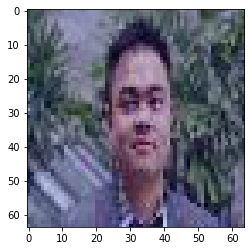

la imagen real es un: person2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


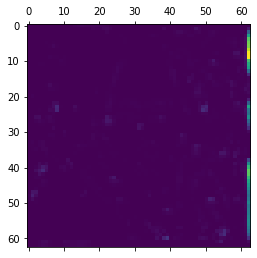

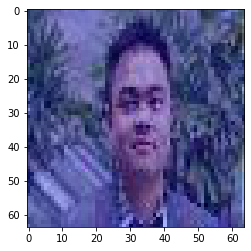


la predicción de la red es: fruit


////////////////////////////////////////////////////////////
IMAGEN REAL



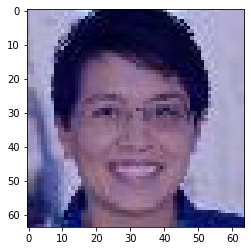

la imagen real es un: person3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


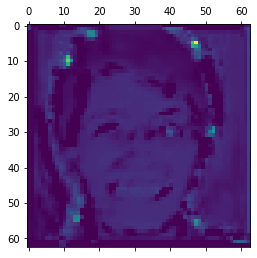

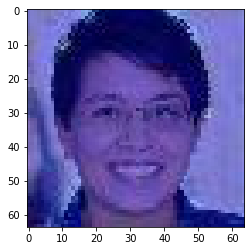


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



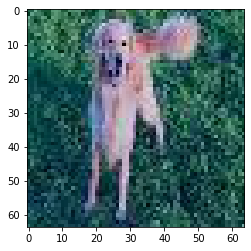

la imagen real es un: perro1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


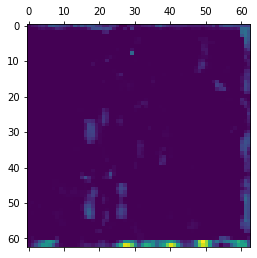

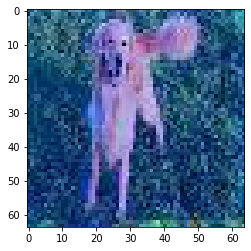


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



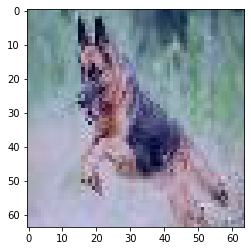

la imagen real es un: perro2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


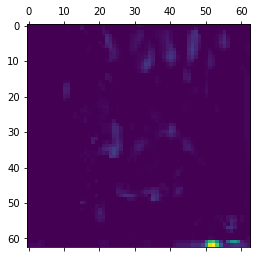

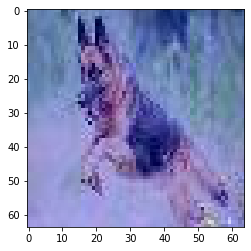


la predicción de la red es: car


////////////////////////////////////////////////////////////
IMAGEN REAL



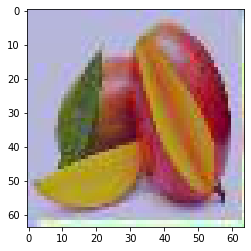

la imagen real es un: fruta2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


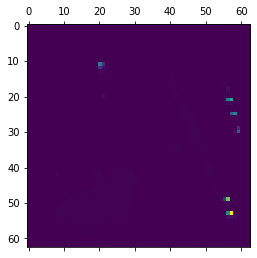

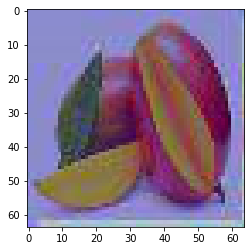


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



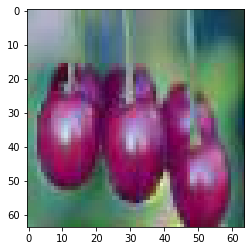

la imagen real es un: fruta3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


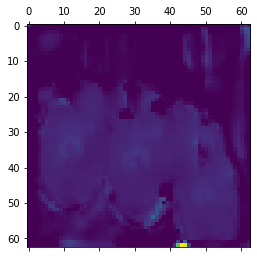

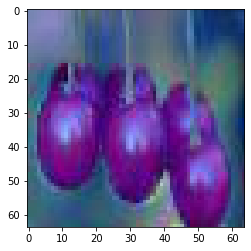


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



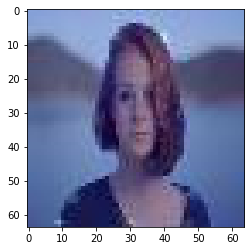

la imagen real es un: person1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


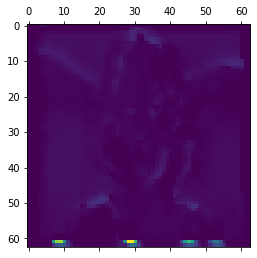

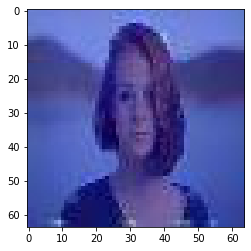


la predicción de la red es: flower


////////////////////////////////////////////////////////////
IMAGEN REAL



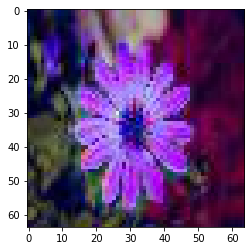

la imagen real es un: flor1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


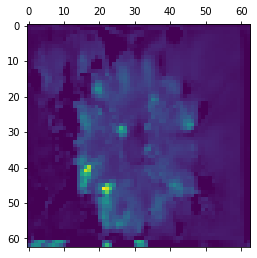

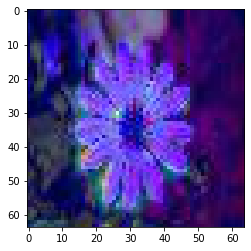


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



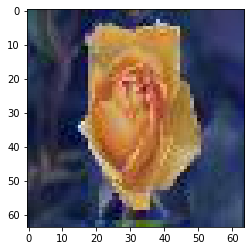

la imagen real es un: flor3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


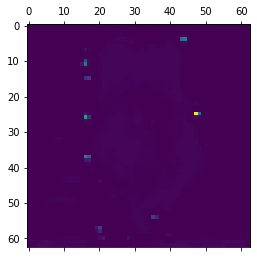

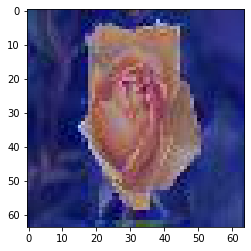


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



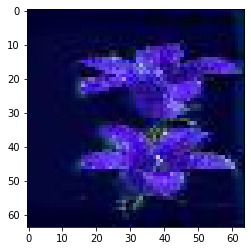

la imagen real es un: flor2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


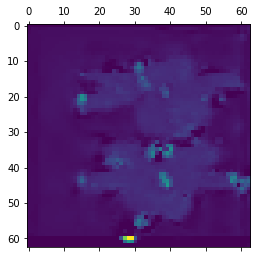

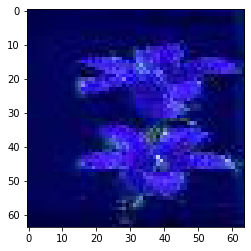


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



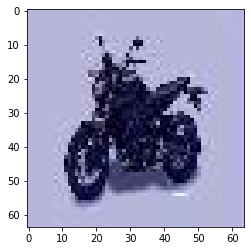

la imagen real es un: moto2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


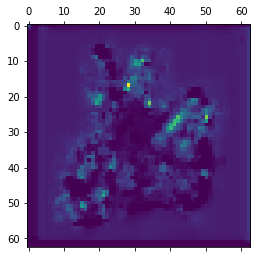

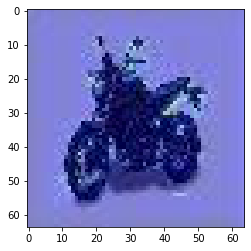


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



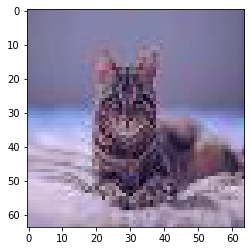

la imagen real es un: gato1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


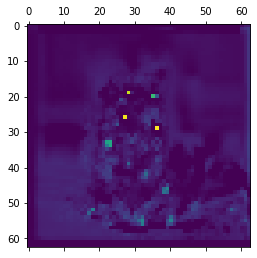

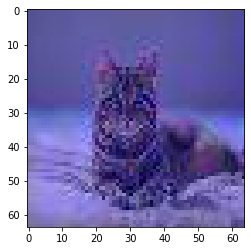


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



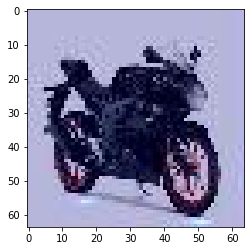

la imagen real es un: moto3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


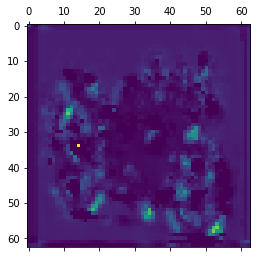

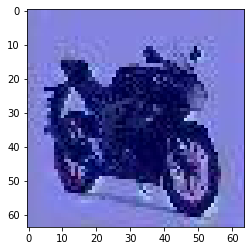


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



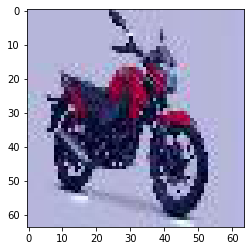

la imagen real es un: moto1._validation

ANALISIS DE LA PREDICCIÓN

heatmap


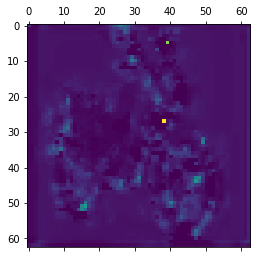

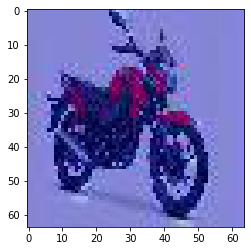


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



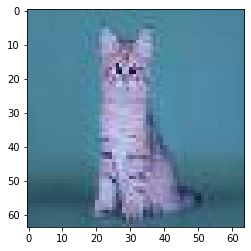

la imagen real es un: gato3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


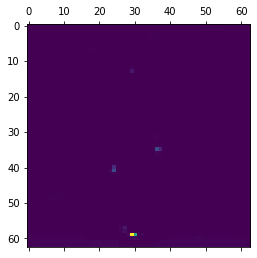

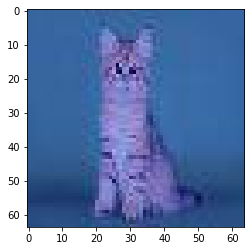


la predicción de la red es: person


////////////////////////////////////////////////////////////
IMAGEN REAL



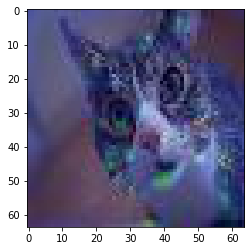

la imagen real es un: gato2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


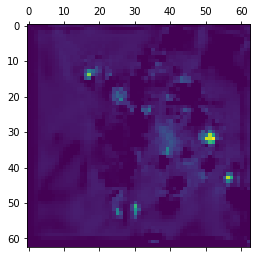

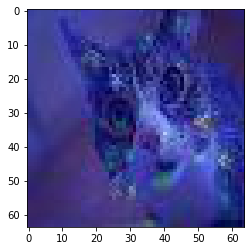


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



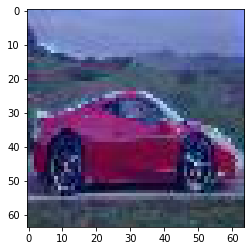

la imagen real es un: carro3._validation

ANALISIS DE LA PREDICCIÓN

heatmap


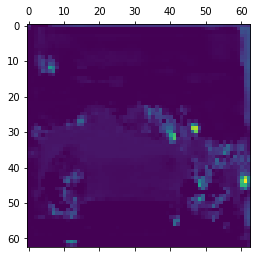

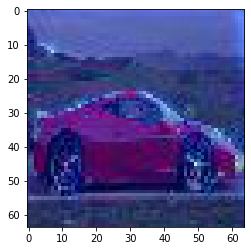


la predicción de la red es: dog


////////////////////////////////////////////////////////////
IMAGEN REAL



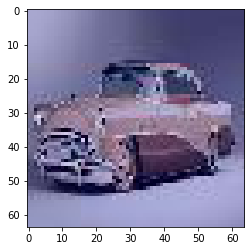

la imagen real es un: carro2._validation

ANALISIS DE LA PREDICCIÓN

heatmap


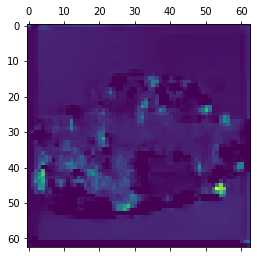

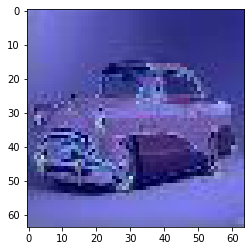


la predicción de la red es: dog




In [43]:
from matplotlib.image import imread
import cv2
dirs = os.listdir("/content/drive/MyDrive/Colab/validacion")
folder="/content/drive/MyDrive/Colab/validacion"
%cd /content/drive/MyDrive/Colab/validacion
i=0
for file in dirs:
  #preprocess_input = keras.applications.xception.preprocess_input
  ad=file[:-4]+'_validation'+'.jpg'
  real=file[:-4]
  name=file
  img_array = get_img_array(name,size=(64,64))
  #img_array = get_img_array(name,False)
  img_array = img_array.astype('float32')/255.0
  #mean = np.mean(img_array,axis=(0,1,2,3))
  #std = np.std(img_array,axis=(0,1,2,3))
  #img_array = (img_array - mean)/(std+1e-7)
  #ver lo que le llega a la red
  print('////////////////////////////////////////////////////////////')
  print('IMAGEN REAL')
  print('')
  plt.imshow(img_array[0][:][:][:], interpolation='nearest')
  plt.show()
  print('la imagen real es un: '+str(real))
  print('')
  print('ANALISIS DE LA PREDICCIÓN')
  print('')
  preds1 = mod_RN.predict(img_array)
  print('heatmap')
  heatmap1 = make_gradcam_heatmap(img_array, mod_RN, 'activation_60')
  plt.matshow(heatmap1)
  plt.show()
  print('')
  print('')
  ad=file[:-4]+'_validation'+'.jpg'
  grad=save_and_display_gradcam(img_array[0][:][:][:],heatmap1,ad)#folder+ad+'val'+file
  o=plt.imread(grad)
  plt.imshow(o)
  plt.show()
  print('')
  print('la predicción de la red es: '+str(labels[(np.argmax(preds1,axis=1))[0]]))
  print('')
  print('')



In [40]:
#IMPORTAMOS LIBRERIAS NECESARIAS
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib as mpl
import seaborn as sns
import tensorflow as tf

from sklearn.metrics import classification_report, confusion_matrix
from IPython import display
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Conv1D, Flatten, MaxPooling1D
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix,confusion_matrix
from string import ascii_uppercase
from google.colab import widgets
from google.colab import files

              precision    recall  f1-score   support

           0       0.93      0.98      0.95       246
           1       0.99      0.98      0.98       310
           2       0.80      0.66      0.72       266
           3       0.73      0.70      0.71       248
           4       0.93      0.96      0.94       275
           5       0.98      1.00      0.99       321
           6       0.95      0.99      0.97       281
           7       0.93      0.98      0.95       330

    accuracy                           0.91      2277
   macro avg       0.90      0.90      0.90      2277
weighted avg       0.91      0.91      0.91      2277

[[240   1   0   0   2   0   3   0]
 [  1 303   1   1   0   0   4   0]
 [  7   1 175  59   6   1   5  12]
 [  6   2  43 173  10   1   2  11]
 [  4   0   0   3 264   0   2   2]
 [  0   0   0   0   0 320   0   1]
 [  0   0   0   0   3   0 278   0]
 [  1   0   0   1   0   3   0 325]]



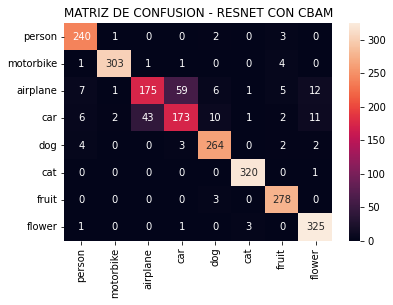

In [47]:

#Accuracy of the predicted values
y_test_predic=mod_RN.predict(X_test)
y_test_predic=etiquetas_2 [(np.argmax(y_test_predic,axis=1))[:]]
y_test_l=etiquetas_2[(np.argmax(Y_test,axis=1))[:]]

cm_har_conv1 = confusion_matrix(y_test_l, y_test_predic)
print(classification_report(y_test_l, y_test_predic)) # Precision , Recall, F1-Score & Support
print(cm_har_conv1)
print("")

# visualize the confusion matrix in a heat map
df_cm_har_conv1 = pd.DataFrame(cm_har_conv1, index= labels , columns = labels)
plt.title("MATRIZ DE CONFUSION - RESNET CON CBAM")
heatmap_har_conv1 = sns.heatmap(df_cm_har_conv1, annot=True, fmt="d")

In [ ]:
!nvidia-smi

Fri May 13 13:45:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    59W / 149W |  11077MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------